In [1]:

import torch
import torchvision
from torchvision import transforms
from torchvision.datasets import CocoDetection
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np
import cv2
from PIL import Image
from torchvision.models.detection import FasterRCNN_ResNet50_FPN_Weights
from torchmetrics.detection import MeanAveragePrecision
import random
from ultralytics import YOLO

WARNING  Python>=3.10 is required, but Python==3.8.10 is currently installed 


loading annotations into memory...
Done (t=0.59s)
creating index...
index created!


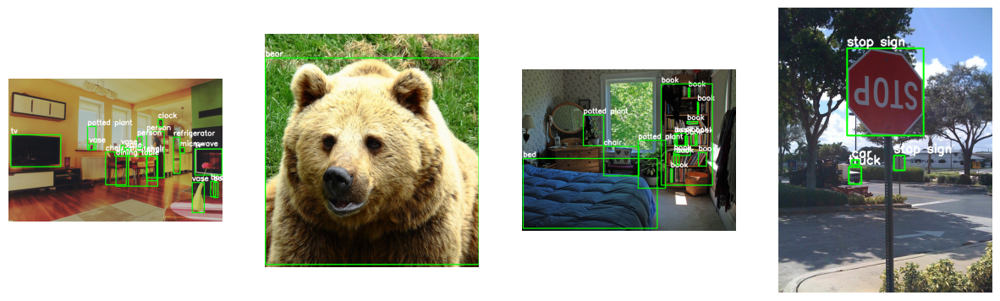

In [2]:
# Show sample images from the dataset
# Custom collate function to handle images of different sizes
def custom_collate_fn(batch):
    images = [item[0] for item in batch]
    targets = [item[1] for item in batch]
    return images, targets

# Update load_coco_dataset to use the custom collate function
def load_coco_dataset():
    transform = transforms.ToTensor()
    ann_file =r"D:\MERNA\CV_assignments\assignment4_part2\Coco\annotations\instances_val2017.json"
    dataset = CocoDetection(
        root=r"D:\MERNA\CV_assignments\assignment4_part2\Coco",
        annFile=ann_file,
        transform=transform
    )
    # Use the class_names variable already defined in the notebook
    return DataLoader(dataset, batch_size=4, shuffle=False, collate_fn=custom_collate_fn)

def show_sample_images(dataloader, class_names=None):
    for images, targets in dataloader:
        fig, axs = plt.subplots(1, len(images), figsize=(15, 5))
        if len(images) == 1:
            axs = [axs]
        for i, (image, target) in enumerate(zip(images, targets)):
            img_np = image.permute(1, 2, 0).numpy()
            img_np = (img_np * 255).astype(np.uint8) if img_np.max() <= 1.0 else img_np.astype(np.uint8)
            img_np = img_np.copy()  # Ensure the array is contiguous for OpenCV
            for ann in target:
                bbox = ann['bbox']  # COCO format: [x, y, width, height]
                x1, y1, w, h = bbox
                x2, y2 = x1 + w, y1 + h
                label_id = ann['category_id']
                label_str = class_names[label_id] if class_names and label_id < len(class_names) else str(label_id)
                cv2.rectangle(img_np, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)
                cv2.putText(img_np, label_str, (int(x1), int(y1) - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255,255,255), 2)
            axs[i].imshow(img_np)
            axs[i].axis('off')
        plt.show()
        break  # Show only one batch
# def print_coco_class_names(coco_class_names):
#     print("COCO Class Names:")
#     for idx, name in enumerate(coco_class_names):
#         print(f"{idx}: {name}")

# Load COCO class names
def load_coco_class_names():
    weights = FasterRCNN_ResNet50_FPN_Weights.DEFAULT
    return weights.meta['categories']
dataloader = load_coco_dataset()
show_sample_images(dataloader, class_names=load_coco_class_names())

In [3]:
# Faster R-CNN
def load_faster_rcnn():
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
    return model

# YOLOv5 using torch.hub
def load_yolov8():
    # Load YOLOv8 model from Ultralytics
    model = YOLO("yolov8n.pt")
    return model

# SSD
def load_ssd():
    model = torchvision.models.detection.ssd300_vgg16(pretrained=True)
    # model.to('cuda' if torch.cuda.is_available() else 'cpu')
    model.eval()
    return model


In [12]:
from PIL import ImageDraw, ImageFont


def visualize_sample(image, boxes, labels=None, scores=None, class_names=None, title="Detections", score_thresh=0.7, gt_boxes=None, gt_labels=None, gt_class_names=None):
    # image: tensor [3, H, W], values in [0,255] (already converted for visualization)
    img = image.permute(1, 2, 0).cpu().numpy()
    img = img.astype(np.uint8)
    # Draw predicted boxes (green)
    for i, box in enumerate(boxes):
        if scores is not None and scores[i] < score_thresh:
            continue
        x1, y1, x2, y2 = map(int, box)
        h, w, _ = img.shape
        x1 = max(0, min(x1, w - 1))
        x2 = max(0, min(x2, w - 1))
        y1 = max(0, min(y1, h - 1))
        y2 = max(0, min(y2, h - 1))
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
        if labels is not None and class_names is not None:
            label_idx = int(labels[i])
            label_str = class_names[label_idx] if label_idx < len(class_names) else str(label_idx)
            cv2.putText(img, label_str, (x1, max(y1 - 5, 10)), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255,255,255), 2)
        elif labels is not None:
            cv2.putText(img, str(labels[i]), (x1, max(y1 - 5, 10)), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255,255,255), 2)
    # Draw ground truth boxes (red)
    if gt_boxes is not None:
        for j, gt_box in enumerate(gt_boxes):
            x1, y1, x2, y2 = map(int, gt_box)
            h, w, _ = img.shape
            x1 = max(0, min(x1, w - 1))
            x2 = max(0, min(x2, w - 1))
            y1 = max(0, min(y1, h - 1))
            y2 = max(0, min(y2, h - 1))
            cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)
    plt.imshow(img)
    plt.axis("off")
    plt.show()

# def visualize_sample(image, boxes, labels, scores=None, class_names=None, score_thresh=0.3):
#     image = image.convert("RGB")
#     draw = ImageDraw.Draw(image)

#     try:
#         font = ImageFont.truetype("arial.ttf", 15)
#     except:
#         font = ImageFont.load_default()

#     for i, box in enumerate(boxes):
#         if scores is not None and scores[i] < score_thresh:
#             continue

#         label = labels[i]
#         score = scores[i] if scores is not None else None
#         class_name = class_names[label] if class_names else str(label)

#         # Make sure box values are integers
#         box = [int(coord) for coord in box]
#         draw.rectangle(box, outline="lime", width=3)

#         text = f"{class_name}"
#         if score is not None:
#             text += f" {score:.2f}"
#         text_size = font.getsize(text)
#         text_location = [box[0], box[1] - text_size[1]]
#         if text_location[1] < 0:
#             text_location[1] = 0

#         # Background rectangle for better visibility
#         draw.rectangle([text_location, [text_location[0] + text_size[0], text_location[1] + text_size[1]]], fill="black")
#         draw.text(text_location, text, fill="white", font=font)

#     plt.imshow(image)

#     plt.axis("off")
#     plt.show()


# Inference

loading annotations into memory...
Done (t=0.47s)
creating index...
index created!
Detected objects: 31
Inference time: 9.429 seconds


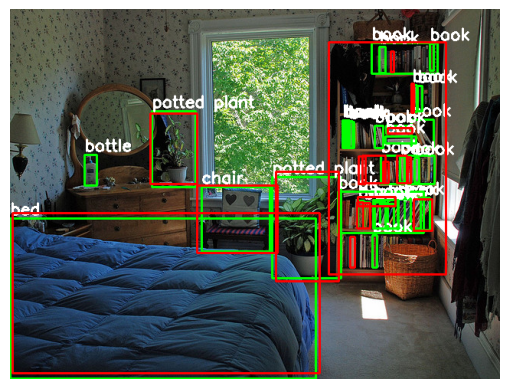

Detected objects: 3
Inference time: 24.864 seconds


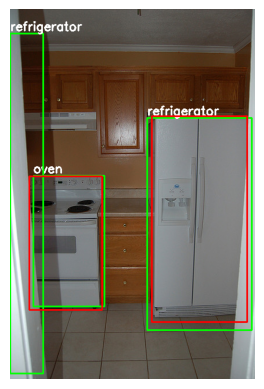

Detected objects: 13
Inference time: 9.936 seconds


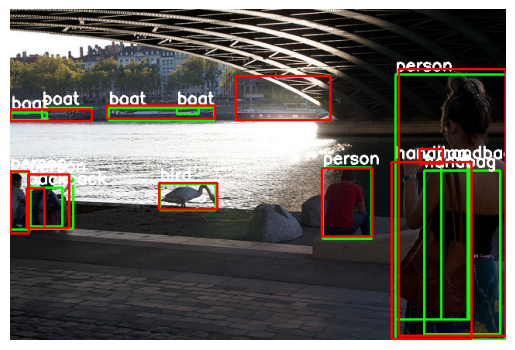

Detected objects: 2
Inference time: 10.184 seconds


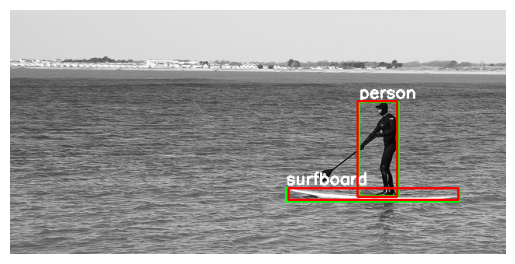

Detected objects: 4
Inference time: 9.520 seconds


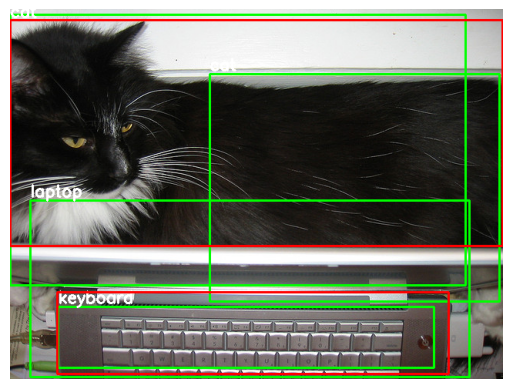

In [ ]:
import time
class_names = load_coco_class_names()

# load and visualize a sample using Faster R-CNN
model = load_faster_rcnn()
model.eval()  # Set the model to evaluation mode
# Use load_coco_dataset() to get the dataloader and class names
dataloader = load_coco_dataset()
i= 2
for batch_idx, (images, targets) in enumerate( dataloader):
    start_time = time.time()
    with torch.no_grad():
        predictions = model(images)
    inference_time = time.time() - start_time
    # Visualize random sample
    pred = predictions[i]
    # Extract ground truth boxes and labels from COCODetection targets for visualization
    gt_boxes = []
    anns = targets[i]
    for ann in anns:
        x, y, w, h = ann['bbox']
        gt_boxes.append([x, y, x + w, y + h])
        
    num_detected = (pred['scores'] > 0.5).sum().item()
    img_tensor = images[i]
    img_tensor = img_tensor.cpu()  # Move to CPU for visualization
    #img_tensor = img_tensor * 255  # Scale to [0, 255] for visualization
    #img_tensor = img_tensor.clamp(0, 255).byte()  # Ensure values are in [0, 255] and convert to byte
    # Only for visualization: convert to numpy, scale, and RGB
    img_np = img_tensor.permute(1, 2, 0).cpu().numpy()
    img_np = (img_np * 255).astype(np.uint8)
    img_np = img_np.copy()  # Ensure the array is contiguous for OpenCV
    # img_np = cv2.cvtColor(img_np, cv2.COLOR_BGR2RGB)
    img_tensor_rgb = torch.from_numpy(img_np).permute(2, 0, 1)
    print(f"Detected objects: {num_detected}")
    print(f"Inference time: {inference_time:.3f} seconds")
    visualize_sample(
        img_tensor_rgb,
        pred['boxes'],
        pred['labels'],
        pred['scores'],
        class_names,
        score_thresh=0.5,
        gt_boxes=gt_boxes,
    )
    if batch_idx == 4:
         break



0: 512x640 1 bottle, 1 chair, 2 potted plants, 1 bed, 3 books, 54.0ms
Speed: 0.0ms preprocess, 54.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)


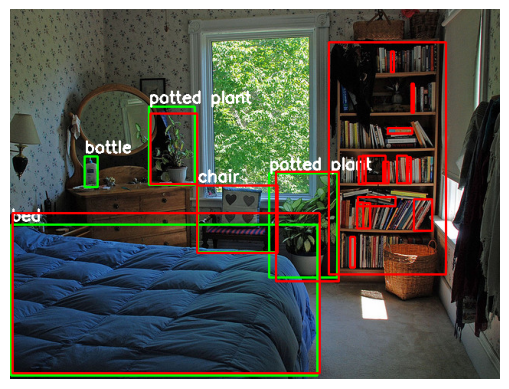


0: 640x448 2 ovens, 1 refrigerator, 53.9ms
Speed: 0.0ms preprocess, 53.9ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 448)


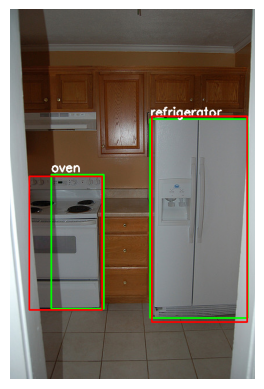


0: 448x640 4 persons, 1 bird, 2 handbags, 53.9ms
Speed: 0.0ms preprocess, 53.9ms inference, 5.4ms postprocess per image at shape (1, 3, 448, 640)


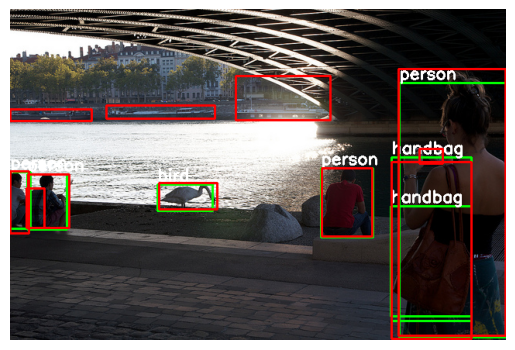


0: 320x640 1 person, 1 surfboard, 53.1ms
Speed: 0.0ms preprocess, 53.1ms inference, 0.0ms postprocess per image at shape (1, 3, 320, 640)


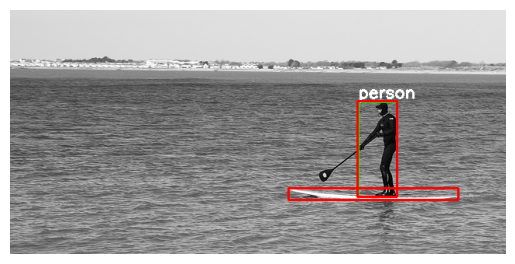


0: 480x640 1 cat, 1 keyboard, 65.6ms
Speed: 2.0ms preprocess, 65.6ms inference, 5.1ms postprocess per image at shape (1, 3, 480, 640)


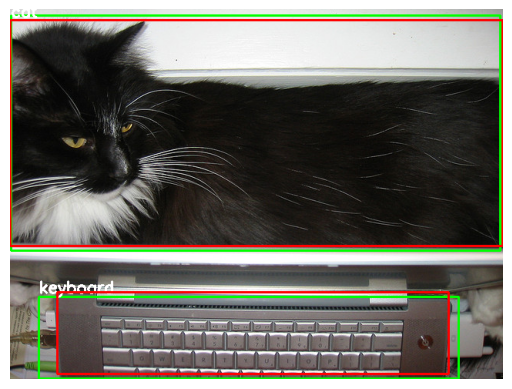

In [16]:
# Load YOLOv8 pretrained model
yolo_model = load_yolov8()  # Already defined in your code

# Run inference over the val set using your dataloader
for batch_idx, (images, targets) in enumerate(dataloader):
    # Select a random image from the batch
    img_tensor = images[i].cpu()
    img_np = img_tensor.permute(1, 2, 0).numpy()
    img_np = (img_np * 255).astype(np.uint8)
    img_np = img_np.copy()  # Ensure contiguous

    yolo_model.to('cpu')
    # YOLOv8 expects RGB numpy array
    results = yolo_model(img_np)

    # Get detections for this image
    det = results[0].boxes
    # Extract ground truth boxes and labels from COCODetection targets for visualization
    gt_boxes = []
    anns = targets[i]
    for ann in anns:
        x, y, w, h = ann['bbox']
        gt_boxes.append([x, y, x + w, y + h])
    if det is not None and len(det) > 0:
        boxes = det.xyxy.cpu().numpy()  # [N, 4]
        scores = det.conf.cpu().numpy()  # [N]
        labels = det.cls.cpu().numpy().astype(int)  # [N]
        yolo_class_names = results[0].names  # Ultralytics YOLOv8 class names
       
        # Prepare image for visualize_sample (convert numpy to tensor in [C, H, W] format)
        img_tensor_rgb = torch.from_numpy(img_np).permute(2, 0, 1)

        visualize_sample(
            img_tensor_rgb,
            boxes,
            labels,
            scores,
            yolo_class_names,
            score_thresh=0.5,
            gt_boxes=gt_boxes,
        )
    else:
        print("No detections above threshold for this image.")

    if batch_idx == 4:
        break

loading annotations into memory...
Done (t=0.31s)
creating index...
index created!
Detected objects: 3
Inference time: 0.754 seconds


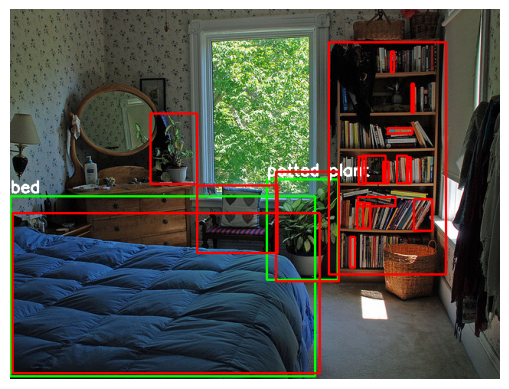

Detected objects: 2
Inference time: 0.758 seconds


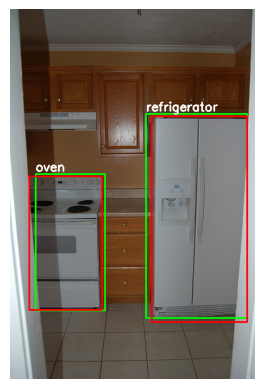

Detected objects: 4
Inference time: 0.763 seconds


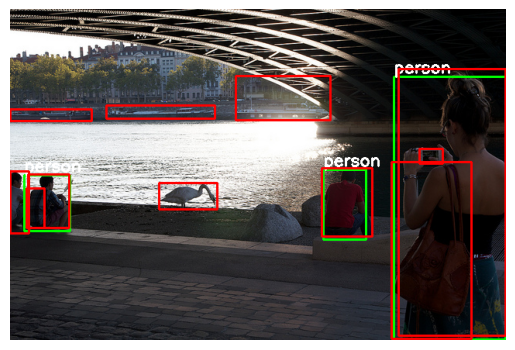

Detected objects: 1
Inference time: 0.773 seconds


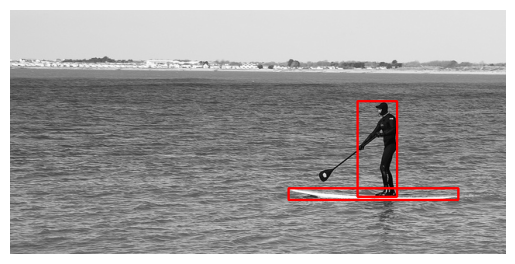

Detected objects: 1
Inference time: 0.746 seconds


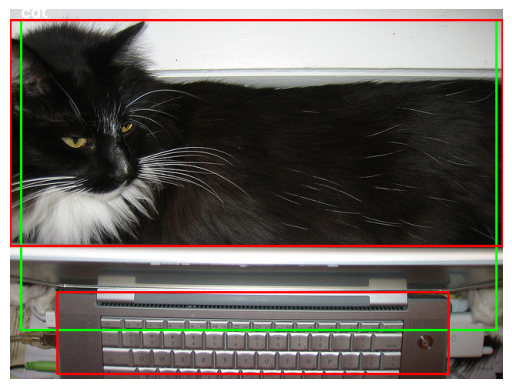

In [20]:
# Load and visualize a sample using SSD
ssd_model = load_ssd()
# Use load_coco_dataset() to get the dataloader and class names
dataloader = load_coco_dataset()
for batch_idx, (images, targets) in enumerate(dataloader):
    start_time = time.time()
    with torch.no_grad():
        predictions = ssd_model(images)
    # Extract ground truth boxes and labels from COCODetection targets for visualization
    gt_boxes = []
    anns = targets[i]
    for ann in anns:
        x, y, w, h = ann['bbox']
        gt_boxes.append([x, y, x + w, y + h])
    inference_time = time.time() - start_time
    # Visualize random sample
    pred = predictions[i]
    
    num_detected = (pred['scores'] > 0.4).sum().item()
    img_tensor = images[i]
    img_tensor = img_tensor.cpu()  # Move to CPU for visualization
    img_np = img_tensor.permute(1, 2, 0).cpu().numpy()
    img_np = (img_np * 255).astype(np.uint8)
    img_np = img_np.copy()  # Ensure the array is contiguous for OpenCV
    img_tensor_rgb = torch.from_numpy(img_np).permute(2, 0, 1)

    print(f"Detected objects: {num_detected}")
    print(f"Inference time: {inference_time:.3f} seconds")

    visualize_sample(
        img_tensor_rgb,
        pred['boxes'],
        pred['labels'],
        pred['scores'],
        class_names,
        score_thresh=0.5,
        gt_boxes=gt_boxes
    )

    if batch_idx == 4:
         break

# Evaluation

In [ ]:
def compute_iou(boxA, boxB):
    # box format: [x1, y1, x2, y2]
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])
    interArea = max(0, xB - xA) * max(0, yB - yA)
    if interArea == 0:
        return 0.0
    boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxBArea = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])
    return interArea / float(boxAArea + boxBArea - interArea)


def calculate_map(predictions, ground_truth):
    metric = MeanAveragePrecision(
        box_format='xyxy',
        iou_type='bbox'  # default
    )
    metric.update(predictions, ground_truth)
    results = metric.compute()
    return {
          'mAP': results['map'].item(),        # mAP@[0.5:0.95]
          'mAP_50': results['map_50'].item(),  # mAP@0.50 threshold
          'mAP_75': results['map_75'].item(),   # mAP@0.75
          'map_small': results['map_small'].item(),  # mAP for small objects
          'map_medium': results['map_medium'].item(),  # mAP for medium objects
          'map_large': results['map_large'].item(),  # mAP for large objects
          'mar_1': results['mar_1'].item(),  # mAR for max detections = 1
          'mar_10': results['mar_10'].item(),  # mAR for max detections = 10
          'mar_100': results['mar_100'].item()  # mAR for max detections = 100

    }

# Convert predictions and ground truths to torchmetrics-compatible format
def prepare_for_map(predictions, targets):
    pred_list = []
    gt_list = []
    for pred, target in zip(predictions, targets):
        # Convert COCO GT bbox format [x, y, w, h] to [x1, y1, x2, y2]
        gt_boxes = []
        gt_labels = []
        for ann in target:
            x, y, w, h = ann['bbox']
            gt_boxes.append([x, y, x + w, y + h])
            gt_labels.append(ann['category_id'])

        pred_list.append({
            "boxes": pred["boxes"].cpu(),
            "scores": pred["scores"].cpu(),
            "labels": pred["labels"].cpu()
        })

        gt_list.append({
            "boxes": torch.tensor(gt_boxes, dtype=torch.float32),
            "labels": torch.tensor(gt_labels, dtype=torch.int64)
        })

    return pred_list, gt_list


In [ ]:
print(torch.version.cuda)
print(torch.cuda.is_available())

12.1
True


In [ ]:
# Evaluate mAP and IOU for Faster R-CNN
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")
model = load_faster_rcnn().to(device)
model.eval()
dataloader = load_coco_dataset()
predictions = []
ground_truth = []

for images, targets in dataloader:
#    print(type(images), type(images[0]), images[0].shape, images[0].dtype)

   images_device = [img.to(device) for img in images]  # Ensure proper format

   with torch.no_grad():
        preds = model([img.to(device) for img in images])
        # Prepare predictions and ground truths
        pred_list, gt_list = prepare_for_map(preds, targets)
        predictions.extend(pred_list)
        ground_truth.extend(gt_list)

# Calculate mAP
map_results = calculate_map(predictions, ground_truth)
# Prepare results for table
metrics = [
    ("mAP", map_results.get('mAP', float('nan'))),
    ("mAP@0.50", map_results.get('mAP_50', float('nan'))),
    ("mAP@0.75", map_results.get('mAP_75', float('nan'))),
    ("mAP_small", map_results.get('map_small', float('nan'))),
    ("mAP_medium", map_results.get('map_medium', float('nan'))),
    ("mAP_large", map_results.get('map_large', float('nan'))),
    ("maxDets=1", map_results.get('mar_1', float('nan'))),
    ("maxDets=10", map_results.get('mar_10', float('nan'))),
    ("maxDets=100", map_results.get('mar_100', float('nan'))),
]

print("\nFaster R-CNN mAP Results:")
print("{:<15} {:<10}".format("Metric", "Value"))
print("-" * 26)
for metric, value in metrics:
    print("{:<15} {:.4f}".format(metric, value))

# # Calculate IOU for the whole dataset
# iou_results = []
# for pred, gt in zip(predictions, ground_truth):
#     pred_boxes = pred['boxes'].cpu().numpy()
#     gt_boxes = gt['boxes'].cpu().numpy()
#     for pred_box in pred_boxes:
#         for gt_box in gt_boxes:
#             iou = compute_iou(pred_box, gt_box)
#             iou_results.append(iou)
# if len(iou_results) > 0:
#     print(f"Average IOU for the whole dataset: {np.mean(iou_results):.4f}")
# else:
#     print("No IOU results to compute.")

matched_ious = []

for pred, gt in zip(predictions, ground_truth):
    pred_boxes = pred['boxes'].cpu().numpy()
    gt_boxes = gt['boxes'].cpu().numpy()

    matched_gt = set()
    for pred_box in pred_boxes:
        best_iou = 0.0 # Initialize best IoU to 0
        best_gt_idx = -1 # Initialize best GT index to -1
        # Iterate through ground truth boxes to find the best match
        for i, gt_box in enumerate(gt_boxes):
            if i in matched_gt:
                continue
            iou = compute_iou(pred_box, gt_box)
            # To handle 1:1 matching
            if iou > best_iou: # Update if this is the best IoU found
                best_iou = iou # Only update if the IoU is better than the current best
                best_gt_idx = i
        # If a match is found with IoU > 0.5, add it to matched_gt
        if best_iou >0.5:
            matched_gt.add(best_gt_idx)
            matched_ious.append(best_iou)

if matched_ious:
    print(f"Average matched IoU: {np.mean(matched_ious):.4f}")
else:
    print("No matched boxes found.")

Using device: cuda
loading annotations into memory...
Done (t=0.43s)
creating index...
index created!

Faster R-CNN mAP Results:
Metric          Value     
--------------------------
mAP             0.3626
mAP@0.50        0.5745
mAP@0.75        0.3905
mAP_small       0.1494
mAP_medium      0.3412
mAP_large       0.4677
maxDets=1       0.3052
maxDets=10      0.4818
maxDets=100     0.5058
Average matched IoU: 0.7906


In [ ]:
# # Evaluate mAP and IOU for YOLOv8 using the dataloader (batch-wise, matching ground truth)
# predictions_yolo = []
# ground_truth_yolo = []
# yolo_model = load_yolov8()
# # Always run YOLOv8 on CPU to avoid torchvision::nms CUDA error
# yolo_model.to('cpu')

# for images, targets in dataloader:
#     for img_tensor, target in zip(images, targets):
#         img_np = img_tensor.permute(1, 2, 0).numpy()
#         img_np = (img_np * 255).astype(np.uint8)
#         img_np = img_np.copy()  # Ensure contiguous

#         with torch.no_grad():
#             results = yolo_model(img_np)

#         det = results[0].boxes
#         if det is not None and len(det) > 0:
#             boxes = det.xyxy.cpu().numpy()  # [N, 4]
#             scores = det.conf.cpu().numpy()  # [N]
#             labels = det.cls.cpu().numpy().astype(int)  # [N]

#             pred_list = {
#                 "boxes": torch.tensor(boxes, dtype=torch.float32),
#                 "scores": torch.tensor(scores, dtype=torch.float32),
#                 "labels": torch.tensor(labels, dtype=torch.int64)
#             }
#         else:
#             pred_list = {
#                 "boxes": torch.zeros((0, 4), dtype=torch.float32),
#                 "scores": torch.zeros((0,), dtype=torch.float32),
#                 "labels": torch.zeros((0,), dtype=torch.int64)
#             }
#         predictions_yolo.append(pred_list)

#         gt_boxes = []
#         gt_labels = []
#         for ann in target:
#             x, y, w, h = ann['bbox']
#             gt_boxes.append([x, y, x + w, y + h])
#             gt_labels.append(ann['category_id'])

#         gt_list = {
#             "boxes": torch.tensor(gt_boxes, dtype=torch.float32),
#             "labels": torch.tensor(gt_labels, dtype=torch.int64)
#         }
#         ground_truth_yolo.append(gt_list)

# # Calculate mAP for YOLOv8
# map_results_yolo = calculate_map(predictions_yolo, ground_truth_yolo)
# # Prepare results for table
# metrics = [
#     ("mAP", map_results_yolo.get('mAP', float('nan'))),
#     ("mAP@0.50", map_results_yolo.get('mAP_50', float('nan'))),
#     ("mAP@0.75", map_results_yolo.get('mAP_75', float('nan'))),
#     ("mAP_small", map_results_yolo.get('map_small', float('nan'))),
#     ("mAP_medium", map_results_yolo.get('map_medium', float('nan'))),
#     ("mAP_large", map_results_yolo.get('map_large', float('nan'))),
#     ("maxDets=1", map_results_yolo.get('mar_1', float('nan'))),
#     ("maxDets=10", map_results_yolo.get('mar_10', float('nan'))),
#     ("maxDets=100", map_results_yolo.get('mar_100', float('nan'))),
# ]

# print("\nYOLOv8 mAP Results:")
# print("{:<15} {:<10}".format("Metric", "Value"))
# print("-" * 26)
# for metric, value in metrics:
#     print("{:<15} {:.4f}".format(metric, value))

# matched_ious_yolo = []

# for pred, gt in zip(predictions_yolo, ground_truth_yolo):
#     pred_boxes = pred['boxes'].cpu().numpy()
#     gt_boxes = gt['boxes'].cpu().numpy()

#     matched_gt = set()
#     for pred_box in pred_boxes:
#         best_iou = 0.0 # Initialize best IoU to 0
#         best_gt_idx = -1 # Initialize best GT index to -1
#         # Iterate through ground truth boxes to find the best match
#         for i, gt_box in enumerate(gt_boxes):
#             if i in matched_gt:
#                 continue
#             iou = compute_iou(pred_box, gt_box)
#             # To handle 1:1 matching
#             if iou > best_iou: # Update if this is the best IoU found
#                 best_iou = iou # Only update if the IoU is better than the current best
#                 best_gt_idx = i
#         # If a match is found with IoU > 0.5, add it to matched_gt
#         if best_iou >0.5:
#             matched_gt.add(best_gt_idx)
#             matched_ious_yolo.append(best_iou)

# if matched_ious_yolo:
#     print(f"Average matched IoU: {np.mean(matched_ious_yolo):.4f}")
# else:
#     print("No matched boxes found.")

In [ ]:
predictions_yolo = []
ground_truth_yolo = []

yolo_model = load_yolov8()
yolo_model.to('cpu')

# YOLOv8 COCO 80-class (0-79) to COCO category_id mapping
yolo_coco_category_ids = [
    1, 2, 3, 4, 5, 6, 7, 8, 9, 10,
    11, 13, 14, 15, 16, 17, 18, 19, 20, 21,
    22, 23, 24, 25, 27, 28, 31, 32, 33, 34,
    35, 36, 37, 38, 39, 40, 41, 42, 43, 44,
    46, 47, 48, 49, 50, 51, 52, 53, 54, 55,
    56, 57, 58, 59, 60, 61, 62, 63, 64, 65,
    67, 70, 72, 73, 74, 75, 76, 77, 78, 79,
    80, 81, 82, 84, 85, 86, 87, 88, 89, 90
]
coco_id_to_yolo_idx = {cat_id: idx for idx, cat_id in enumerate(yolo_coco_category_ids)}

for images, targets in dataloader:
    for img_tensor, target in zip(images, targets):
        img_np = img_tensor.permute(1, 2, 0).numpy()
        img_np = (img_np * 255).astype(np.uint8)
        img_np = img_np.copy()

        with torch.no_grad():
            results = yolo_model(img_np)

        det = results[0].boxes
        if det is not None and len(det) > 0:
            boxes = det.xyxy.cpu().numpy()
            scores = det.conf.cpu().numpy()
            labels = det.cls.cpu().numpy().astype(int)

            pred_list = {
                "boxes": torch.tensor(boxes, dtype=torch.float32),
                "scores": torch.tensor(scores, dtype=torch.float32),
                "labels": torch.tensor(labels, dtype=torch.int64)
            }
        else:
            pred_list = {
                "boxes": torch.zeros((0, 4), dtype=torch.float32),
                "scores": torch.zeros((0,), dtype=torch.float32),
                "labels": torch.zeros((0,), dtype=torch.int64)
            }

        predictions_yolo.append(pred_list)

        # Prepare GT boxes with remapped category_id -> YOLO idx
        gt_boxes = []
        gt_labels = []
        for ann in target:
            x, y, w, h = ann['bbox']
            gt_boxes.append([x, y, x + w, y + h])

            yolo_idx = coco_id_to_yolo_idx.get(ann['category_id'], -1)
            if yolo_idx != -1:
                gt_labels.append(yolo_idx)
            else:
                print(f"Unmapped category_id {ann['category_id']} in GT. Ignored.")

        if len(gt_labels) > 0:
            gt_list = {
                "boxes": torch.tensor(gt_boxes, dtype=torch.float32),
                "labels": torch.tensor(gt_labels, dtype=torch.int64)
            }
            ground_truth_yolo.append(gt_list)
        else:
            ground_truth_yolo.append({
                "boxes": torch.zeros((0, 4), dtype=torch.float32),
                "labels": torch.zeros((0,), dtype=torch.int64)
            })

        # 🔍 Sanity check IoU for debugging
        if pred_list['boxes'].shape[0] > 0 and gt_list['boxes'].shape[0] > 0:
            from torchvision.ops import box_iou
            iou = box_iou(pred_list['boxes'], gt_list['boxes'])
            print(f"Mean IoU for this image: {iou.mean().item():.4f}")

# Calculate mAP
map_results_yolo = calculate_map(predictions_yolo, ground_truth_yolo)

metrics = [
    ("mAP", map_results_yolo.get('mAP', float('nan'))),
    ("mAP@0.50", map_results_yolo.get('mAP_50', float('nan'))),
    ("mAP@0.75", map_results_yolo.get('mAP_75', float('nan'))),
    ("mAP_small", map_results_yolo.get('map_small', float('nan'))),
    ("mAP_medium", map_results_yolo.get('map_medium', float('nan'))),
    ("mAP_large", map_results_yolo.get('map_large', float('nan'))),
    ("maxDets=1", map_results_yolo.get('mar_1', float('nan'))),
    ("maxDets=10", map_results_yolo.get('mar_10', float('nan'))),
    ("maxDets=100", map_results_yolo.get('mar_100', float('nan'))),
]

print("\nYOLOv8 mAP Results:")
print("{:<15} {:<10}".format("Metric", "Value"))
print("-" * 26)
for metric, value in metrics:
    print("{:<15} {:.4f}".format(metric, value))

# Calculate IOU for the whole dataset
matched_ious_yolo = []

for pred, gt in zip(predictions_yolo, ground_truth_yolo):
    pred_boxes = pred['boxes'].cpu().numpy()
    gt_boxes = gt['boxes'].cpu().numpy()

    matched_gt = set()
    for pred_box in pred_boxes:
        best_iou = 0.0 # Initialize best IoU to 0
        best_gt_idx = -1 # Initialize best GT index to -1
        # Iterate through ground truth boxes to find the best match
        for i, gt_box in enumerate(gt_boxes):
            if i in matched_gt:
                continue
            iou = compute_iou(pred_box, gt_box)
            # To handle 1:1 matching
            if iou > best_iou: # Update if this is the best IoU found
                best_iou = iou # Only update if the IoU is better than the current best
                best_gt_idx = i
        # If a match is found with IoU > 0.5, add it to matched_gt
        if best_iou >0.5:
            matched_gt.add(best_gt_idx)
            matched_ious_yolo.append(best_iou)

if matched_ious_yolo:
    print(f"Average matched IoU: {np.mean(matched_ious_yolo):.4f}")
else:
    print("No matched boxes found.")



0: 448x640 1 person, 3 chairs, 1 tv, 1 clock, 1 vase, 47.9ms
Speed: 6.8ms preprocess, 47.9ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)
Mean IoU for this image: 0.0586

0: 640x608 1 bear, 55.0ms
Speed: 5.9ms preprocess, 55.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 608)
Mean IoU for this image: 0.9187

0: 512x640 1 bottle, 1 chair, 2 potted plants, 1 bed, 3 books, 48.4ms
Speed: 0.0ms preprocess, 48.4ms inference, 6.2ms postprocess per image at shape (1, 3, 512, 640)
Mean IoU for this image: 0.0350

0: 640x480 1 truck, 2 stop signs, 42.4ms
Speed: 5.9ms preprocess, 42.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 480)
Mean IoU for this image: 0.1853

0: 640x448 3 teddy bears, 47.7ms
Speed: 3.7ms preprocess, 47.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 448)
Mean IoU for this image: 0.4456

0: 448x640 1 person, 1 skis, 42.4ms
Speed: 5.6ms preprocess, 42.4ms inference, 0.0ms postprocess per image at shape (1

In [ ]:
# Evaluate mAP and IOU for SSD
ssd_model = load_ssd()
ssd_model.to('cpu')
ssd_model.eval()
predictions_ssd = []
ground_truth_ssd = []
for images, targets in dataloader:
    images_device = [img.to('cpu') for img in images]  # Ensure proper format

    with torch.no_grad():
        results = ssd_model(images_device)
        for i, result in enumerate(results):
            if result['boxes'] is not None and len(result['boxes']) > 0:
                boxes = result['boxes'].cpu().numpy()  # [N, 4]
                scores = result['scores'].cpu().numpy()  # [N]
                labels = result['labels'].cpu().numpy().astype(int)  # [N]

                pred_list = {
                    "boxes": torch.tensor(boxes, dtype=torch.float32),
                    "scores": torch.tensor(scores, dtype=torch.float32),
                    "labels": torch.tensor(labels, dtype=torch.int64)
                }
                predictions_ssd.append(pred_list)

                gt_boxes = []
                gt_labels = []
                for ann in targets[i]:
                    x, y, w, h = ann['bbox']
                    gt_boxes.append([x, y, x + w, y + h])
                    gt_labels.append(ann['category_id'])

                gt_list = {
                    "boxes": torch.tensor(gt_boxes, dtype=torch.float32),
                    "labels": torch.tensor(gt_labels, dtype=torch.int64)
                }
                ground_truth_ssd.append(gt_list)
# Calculate mAP for SSD
map_results_ssd = calculate_map(predictions_ssd, ground_truth_ssd)
# Prepare results for table
metrics = [
    ("mAP", map_results_ssd.get('mAP', float('nan'))),
    ("mAP@0.50", map_results_ssd.get('mAP_50', float('nan'))),
    ("mAP@0.75", map_results_ssd.get('mAP_75', float('nan'))),
    ("mAP_small", map_results_ssd.get('map_small', float('nan'))),
    ("mAP_medium", map_results_ssd.get('map_medium', float('nan'))),
    ("mAP_large", map_results_ssd.get('map_large', float('nan'))),
    ("maxDets=1", map_results_ssd.get('mar_1', float('nan'))),
    ("maxDets=10", map_results_ssd.get('mar_10', float('nan'))),
    ("maxDets=100", map_results_ssd.get('mar_100', float('nan'))),
]
print("\nSSD mAP Results:")
print("{:<15} {:<10}".format("Metric", "Value"))
print("-" * 26)
for metric, value in metrics:
    print("{:<15} {:.4f}".format(metric, value))
# Calculate IOU for the whole dataset
matched_ious_ssd = []

for pred, gt in zip(predictions_ssd, ground_truth_ssd):
    pred_boxes = pred['boxes'].cpu().numpy()
    gt_boxes = gt['boxes'].cpu().numpy()

    matched_gt = set()
    for pred_box in pred_boxes:
        best_iou = 0.0 # Initialize best IoU to 0
        best_gt_idx = -1 # Initialize best GT index to -1
        # Iterate through ground truth boxes to find the best match
        for i, gt_box in enumerate(gt_boxes):
            if i in matched_gt:
                continue
            iou = compute_iou(pred_box, gt_box)
            # To handle 1:1 matching
            if iou > best_iou: # Update if this is the best IoU found
                best_iou = iou # Only update if the IoU is better than the current best
                best_gt_idx = i
        # If a match is found with IoU > 0.5, add it to matched_gt
        if best_iou >0.5:
            matched_gt.add(best_gt_idx)
            matched_ious_ssd.append(best_iou)

if matched_ious_ssd:
    print(f"Average matched IoU: {np.mean(matched_ious_ssd):.4f}")
else:
    print("No matched boxes found.")


C:\Users\Merna\AppData\Roaming\Python\Python38\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\Merna\AppData\Roaming\Python\Python38\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=SSD300_VGG16_Weights.COCO_V1`. You can also use `weights=SSD300_VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
C:\Users\Merna\AppData\Roaming\Python\Python38\site-packages\torchmetrics\utilities\prints.py:43: UserWarning: Encountered more than 100 detections in a single image. This means that certain detections with the lowest scores will be ignored, that may have an undesirable impact on performance. Please consider adjusting the `max_dete


SSD mAP Results:
Metric          Value     
--------------------------
mAP             0.2479
mAP@0.50        0.4096
mAP@0.75        0.2599
mAP_small       0.0218
mAP_medium      0.1781
mAP_large       0.4148
maxDets=1       0.2379
maxDets=10      0.3422
maxDets=100     0.3629
Average matched IoU: 0.7426


# Another Dataset for testing Pascal VOC

100%|██████████| 1999639040/1999639040 [42:27<00:00, 785002.88it/s]  


Extracting path_to_voc_root\VOCtrainval_11-May-2012.tar to path_to_voc_root


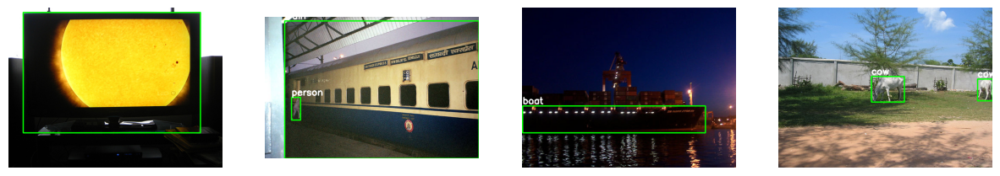

In [9]:
from torchvision.datasets import VOCDetection
# Load Pascal VOC 2012 dataset
def load_voc_dataset():
    voc_dataset = VOCDetection(
    root='path_to_voc_root',
    year='2012',
    image_set='val',
    download=True,  # It will auto-download if not present
    transform=transforms.ToTensor()
)

    voc_loader = DataLoader(voc_dataset, batch_size=4, shuffle=False, collate_fn=custom_collate_fn)
    return voc_loader

# Load pascal VOC class names
def load_voc_class_names():
    return [
        "aeroplane", "bicycle", "bird", "boat", "bottle",
        "bus", "car", "cat", "chair", "cow",
        "diningtable", "dog", "horse", "motorbike", "person",
        "pottedplant", "sheep", "sofa", "train", "tvmonitor"
    ]
def show_sample_images_VOC(dataloader, class_names=None):
    for images, targets in dataloader:
        fig, axs = plt.subplots(1, len(images), figsize=(15, 5))
        if len(images) == 1:
            axs = [axs]
        for i, (image, target) in enumerate(zip(images, targets)):
            img_np = image.permute(1, 2, 0).numpy()
            img_np = (img_np * 255).astype(np.uint8) if img_np.max() <= 1.0 else img_np.astype(np.uint8)
            img_np = img_np.copy()  # Ensure contiguous for cv2

            objects = target['annotation']['object']
            if not isinstance(objects, list):
                objects = [objects]  # Ensure list
            for ann in objects:
                label_str = ann['name']
                bbox = ann['bndbox']
                x1, y1, x2, y2 = int(bbox['xmin']), int(bbox['ymin']), int(bbox['xmax']), int(bbox['ymax'])
                cv2.rectangle(img_np, (x1, y1), (x2, y2), (0, 255, 0), 2)
                cv2.putText(img_np, label_str, (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255,255,255), 2)

            axs[i].imshow(img_np)
            axs[i].axis('off')
        plt.show()
        break  # Show only one batch


# Visualize sample images from Pascal VOC dataset
dataloader_voc = load_voc_dataset()
show_sample_images_VOC(dataloader_voc, class_names=load_voc_class_names())

In [14]:
def visualize_sample_voc(image, boxes, labels=None, scores=None, class_names=None, title="Detections", score_thresh=0.7):
    img = image.permute(1, 2, 0).cpu().numpy()
    img = img.astype(np.uint8)
    for i, box in enumerate(boxes):
        if scores is not None and scores[i] < score_thresh:
            continue
        x1, y1, x2, y2 = map(int, box)
        h, w, _ = img.shape
        x1 = max(0, min(x1, w - 1))
        x2 = max(0, min(x2, w - 1))
        y1 = max(0, min(y1, h - 1))
        y2 = max(0, min(y2, h - 1))
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
        if labels is not None and class_names is not None:
            label_idx = int(labels[i])
            if 0 <= label_idx <= len(class_names):
                label_str = class_names[label_idx ]
            else:
                label_str = str(label_idx)
            cv2.putText(img, label_str, (x1, max(y1 - 5, 10)), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2)
        elif labels is not None:
            cv2.putText(img, str(labels[i]), (x1, max(y1 - 5, 10)), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2)
    plt.imshow(img)
    plt.title(title)
    plt.axis("off")
    plt.show()


Detected objects: 2
Inference time: 25.026 seconds


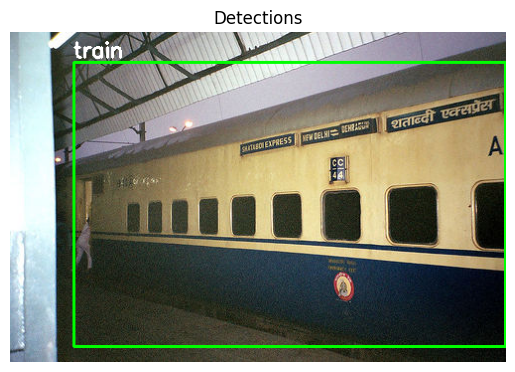

Detected objects: 1
Inference time: 22.950 seconds


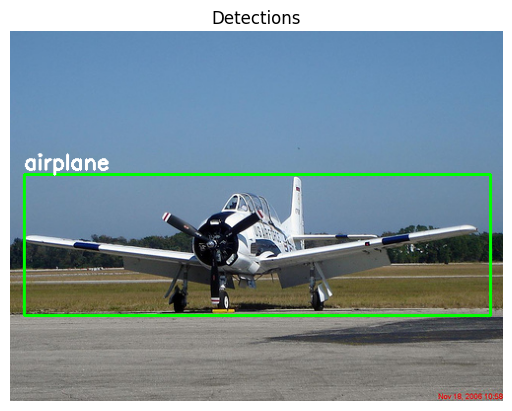

Detected objects: 8
Inference time: 34.883 seconds


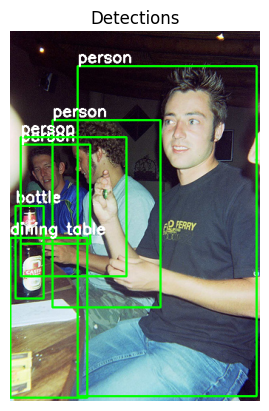

Detected objects: 20
Inference time: 28.693 seconds


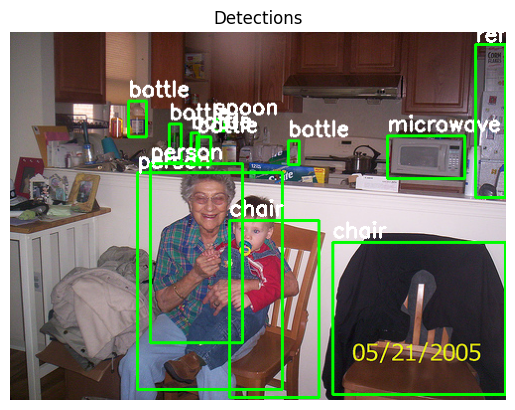

Detected objects: 1
Inference time: 31.890 seconds


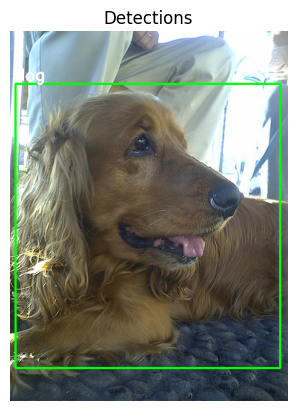

In [15]:
import time
# load and visualize a sample using Faster R-CNN
model_voc = load_faster_rcnn()
model_voc.eval()
# Use load_voc_dataset() to get the dataloader and class names
dataloader_voc = load_voc_dataset()
i = 1
for batch_idx, (images, targets) in enumerate(dataloader_voc):
    start_time = time.time()
    with torch.no_grad():
        predictions = model_voc(images)
    inference_time = time.time() - start_time
    # Visualize random sample
    pred = predictions[i]
    num_detected = (pred['scores'] > 0.5).sum().item()
    img_tensor = images[i]
    img_tensor = img_tensor.cpu()  # Move to CPU for visualization
    img_np = img_tensor.permute(1, 2, 0).cpu().numpy()
    img_np = (img_np * 255).astype(np.uint8)
    img_np = img_np.copy()  # Ensure the array is contiguous for OpenCV
    img_tensor_rgb = torch.from_numpy(img_np).permute(2, 0, 1)

    print(f"Detected objects: {num_detected}")
    print(f"Inference time: {inference_time:.3f} seconds")

    visualize_sample_voc(
        img_tensor_rgb,
        pred['boxes'],
        pred['labels'],
        pred['scores'],
        load_coco_class_names(),
        score_thresh=0.7
    )
    if batch_idx == 4:
         break


0: 448x640 1 person, 1 train, 52.9ms
Speed: 2.0ms preprocess, 52.9ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)
['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush']


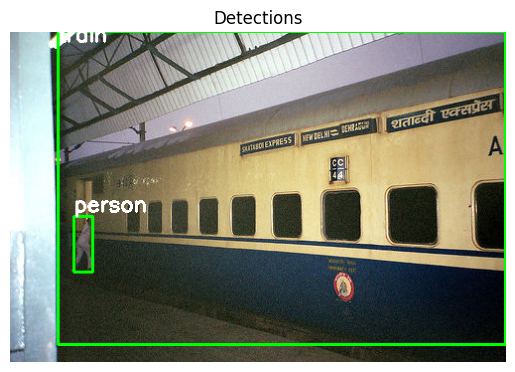


0: 480x640 1 airplane, 57.3ms
Speed: 1.0ms preprocess, 57.3ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)
['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush']


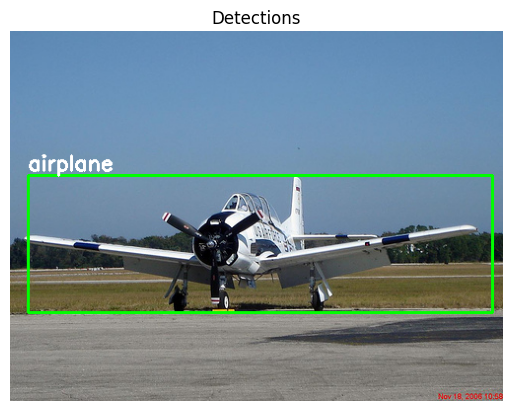


0: 640x448 3 persons, 1 bottle, 50.1ms
Speed: 2.0ms preprocess, 50.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 448)
['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush']


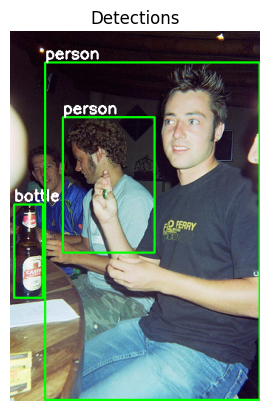


0: 480x640 1 person, 2 bottles, 1 cup, 2 chairs, 1 microwave, 87.3ms
Speed: 1.6ms preprocess, 87.3ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)
['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear',

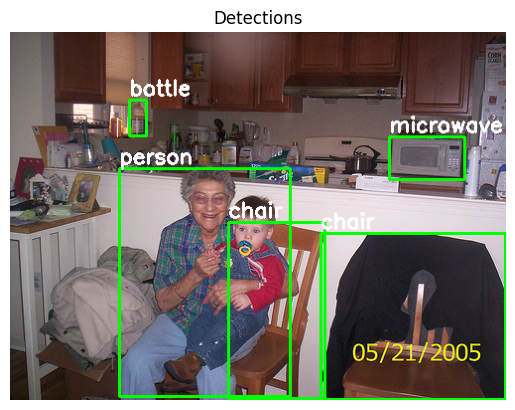


0: 640x480 1 dog, 73.1ms
Speed: 2.0ms preprocess, 73.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)
['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush']


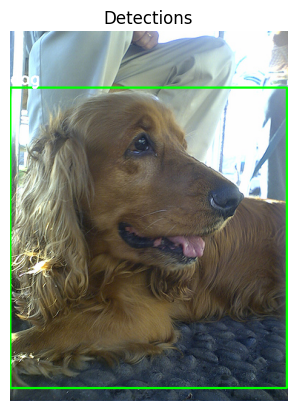

In [15]:
# Load official pretrained model or your saved model
yolo_model_voc = YOLO('/content/yolov8n.pt')
yolo_model_voc.to('cpu') 
# Run inference over the val set using your dataloader
i=1
for batch_idx, (images, targets) in enumerate(dataloader_voc):
    # Select a random image from the batch
    img_tensor = images[i].cpu()
    img_np = img_tensor.permute(1, 2, 0).numpy()
    img_np = (img_np * 255).astype(np.uint8)
    img_np = img_np.copy()  # Ensure contiguous
    
    # YOLOv8 expects RGB numpy array
    results = yolo_model_voc(img_np)

    # Get detections for this image
    det = results[0].boxes
    if det is not None and len(det) > 0:
        boxes = det.xyxy.cpu().numpy()  # [N, 4]
        scores = det.conf.cpu().numpy()  # [N]
        labels = det.cls.cpu().numpy().astype(int)  # [N]
        yolo_class_names = list(results[0].names.values())  # Get list of class names
        print(yolo_class_names)
        # Prepare image for visualize_sample (convert numpy to tensor in [C, H, W] format)
        img_tensor_rgb = torch.from_numpy(img_np).permute(2, 0, 1)

        visualize_sample_voc(
            img_tensor_rgb,
            boxes,
            labels,
            scores,
            yolo_class_names,
            score_thresh=0.5
        )
    else:
        print("No detections above threshold for this image.")

    if batch_idx == 4:
        break

Detected objects: 1
Inference time: 3.744 seconds


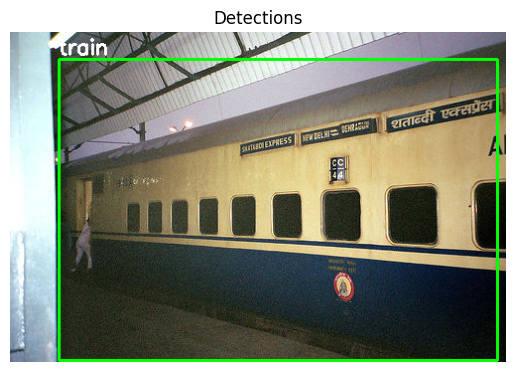

Detected objects: 1
Inference time: 3.155 seconds


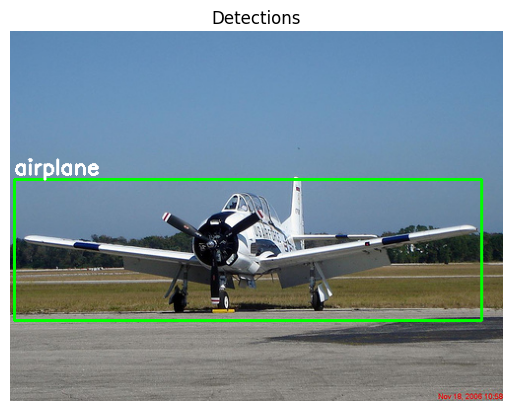

Detected objects: 3
Inference time: 3.149 seconds


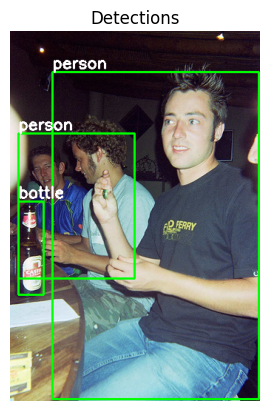

Detected objects: 6
Inference time: 4.016 seconds


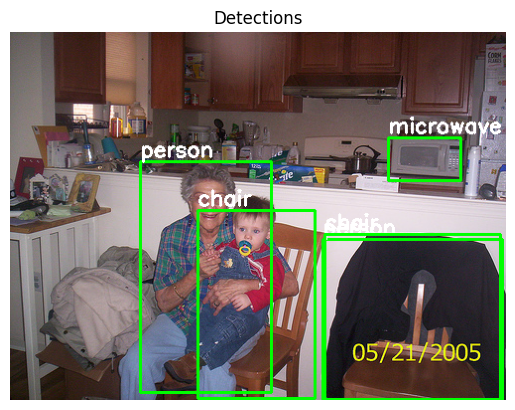

Detected objects: 1
Inference time: 3.246 seconds


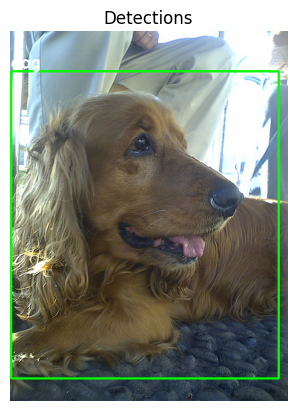

In [20]:
# load and visualize a sample using SSD
ssd_model_voc = load_ssd()
# Use load_voc_dataset() to get the dataloader and class names
dataloader_voc = load_voc_dataset()
for batch_idx, (images, targets) in enumerate(dataloader_voc):
    start_time = time.time()
    with torch.no_grad():
        predictions = ssd_model_voc(images)
    inference_time = time.time() - start_time
    # Visualize random sample
    pred = predictions[i]
    num_detected = (pred['scores'] > 0.4).sum().item()
    img_tensor = images[i]
    img_tensor = img_tensor.cpu()  # Move to CPU for visualization
    img_np = img_tensor.permute(1, 2, 0).cpu().numpy()
    img_np = (img_np * 255).astype(np.uint8)
    img_np = img_np.copy()  # Ensure the array is contiguous for OpenCV
    img_tensor_rgb = torch.from_numpy(img_np).permute(2, 0, 1)
    print(f"Detected objects: {num_detected}")
    print(f"Inference time: {inference_time:.3f} seconds")
    visualize_sample_voc(
        img_tensor_rgb,
        pred['boxes'],
        pred['labels'],
        pred['scores'],
        load_coco_class_names(),
        score_thresh=0.5
    )
    if batch_idx == 4:
         break